# Classification

Once we have objects localized, we can try using a neural network for image classification.

## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
import torch

import numpy as np
import albumentations as A

from scripts.config import ID_TO_LABEL
from scripts.viz import plot_images
from scripts.training import train_model, get_best_available_device
from scripts.utils import split_data, get_images_from_coco, ClassificationDataset

from torch.utils.data import DataLoader
from torch import optim, nn
from torch.optim.lr_scheduler import CosineAnnealingLR
from torchvision import models

## Hyperparameters and Config

In [5]:
# let's specify paths to training images and masks
images_path = "data/train"
coins_path = "data/classification"
annotation_path = "data/annotations.json"
labels_path = "data/classification/labels.json"

In [23]:
# training hyperparameters
num_epochs = 50
batch_size = 8
lr = 0.001
momentum = 0.9

## Data Augmentation

We first define data augmentations for more robust model, then generate datasets and dataloaders for training and validation.

In [7]:
get_images_from_coco(images_path, annotation_path)

Files already there, good to go!


In [8]:
# define data augmentation for train and validation
train_tf = A.Compose([
    A.Resize(width=224, height=224, always_apply=True),
    A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
])

valid_tf = A.Compose([
    A.Resize(width=224, height=224, always_apply=True),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))  # imagenet specific
])

In [9]:
# split the image paths into train and validation
images_train, images_val, _, _ = split_data(coins_path, 0.2, "classification")

# get train and val dataset instances
train_ds = ClassificationDataset(
    image_paths=images_train,
    labels_path=labels_path,
    transform=train_tf,
)

val_ds = ClassificationDataset(
    image_paths=images_val,
    labels_path=labels_path,
    transform=valid_tf,
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


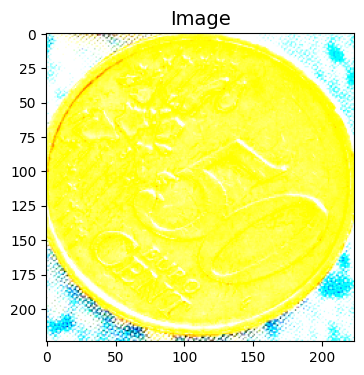

In [10]:
img, label = train_ds[7]
plot_images(image=img)

In [11]:
# create dataloaders
train_loader = DataLoader(train_ds, batch_size)
val_loader = DataLoader(val_ds, batch_size)

## Modelling

We use `Segmentation Models Pytorch` for model generation, then we define training arguments and train the model

In [24]:
model = models.resnet50(weights='IMAGENET1K_V2')

for param in model.parameters():
    param.requires_grad = False

num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 16)

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
scheduler = CosineAnnealingLR(optimizer, T_max=5, eta_min=1e-6)

In [26]:
# train the model
train_losses, valid_losses, train_f1s, valid_f1s = train_model(
    model,
    (train_loader, val_loader),
    criterion,
    optimizer,
    scheduler,
    num_epochs
)

Epoch:   1. Train.      Loss: 2.641 | f1: 0.147: 100%|██████████| 39/39 [00:06<00:00,  5.85it/s]
Epoch:   1. Validation. Loss: 2.506 | f1: 0.328: 100%|██████████| 10/10 [00:01<00:00,  8.21it/s]
Epoch:   2. Train.      Loss: 2.298 | f1: 0.401: 100%|██████████| 39/39 [00:05<00:00,  7.63it/s]
Epoch:   2. Validation. Loss: 2.313 | f1: 0.415: 100%|██████████| 10/10 [00:01<00:00,  8.49it/s]
Epoch:   3. Train.      Loss: 2.075 | f1: 0.554: 100%|██████████| 39/39 [00:05<00:00,  7.64it/s]
Epoch:   3. Validation. Loss: 2.160 | f1: 0.420: 100%|██████████| 10/10 [00:01<00:00,  8.48it/s]
Epoch:   4. Train.      Loss: 1.870 | f1: 0.676: 100%|██████████| 39/39 [00:05<00:00,  7.56it/s]
Epoch:   4. Validation. Loss: 2.027 | f1: 0.540: 100%|██████████| 10/10 [00:01<00:00,  8.45it/s]
Epoch:   5. Train.      Loss: 1.688 | f1: 0.740: 100%|██████████| 39/39 [00:05<00:00,  7.58it/s]
Epoch:   5. Validation. Loss: 1.911 | f1: 0.553: 100%|██████████| 10/10 [00:01<00:00,  8.39it/s]
Epoch:   6. Train.      Loss: 

In [27]:
torch.save(model.state_dict(), 'classification_20eps.pt')

## Inference

Let's see how well the model does.

In [28]:
device = get_best_available_device()

model.load_state_dict(torch.load('classification_20eps.pt'))
model = model.to(device)

_ = model.eval()

In [29]:
eval_loader = DataLoader(val_ds, batch_size=6)

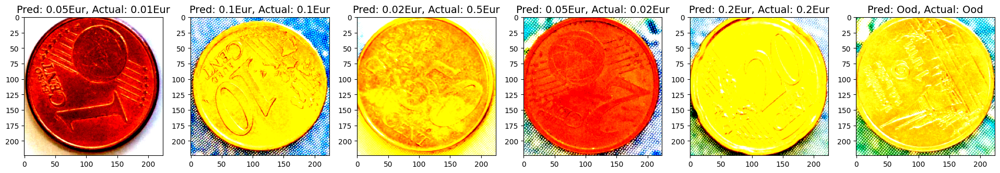

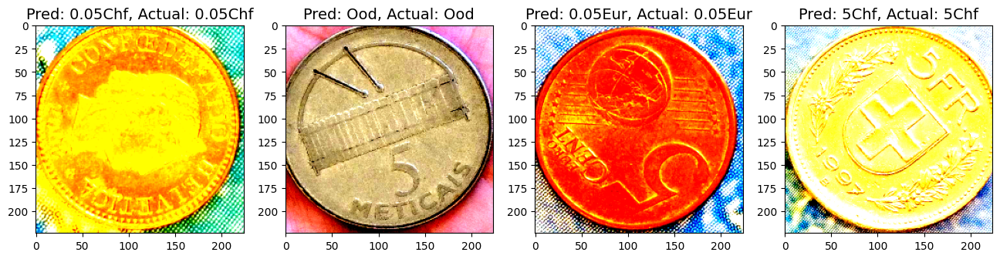

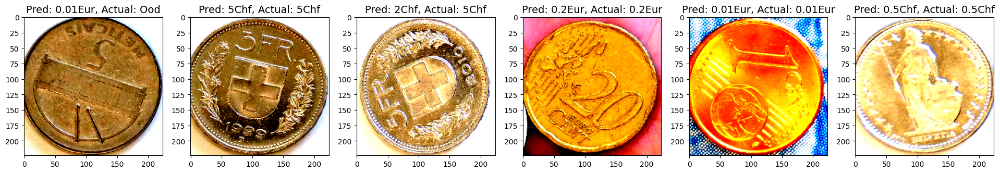

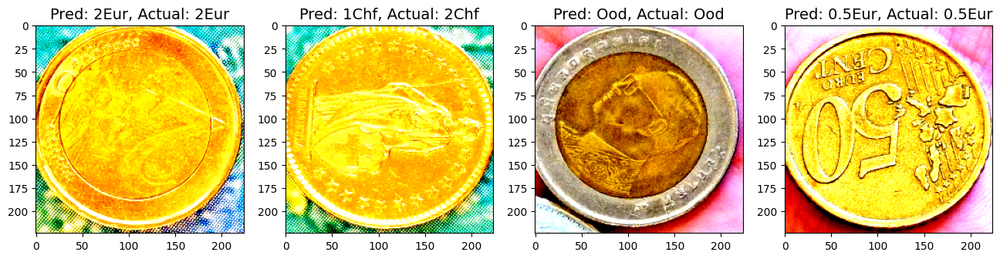

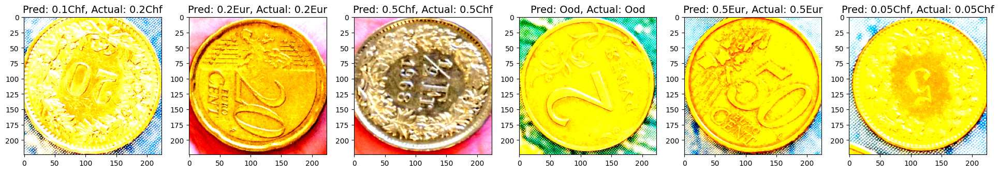

...

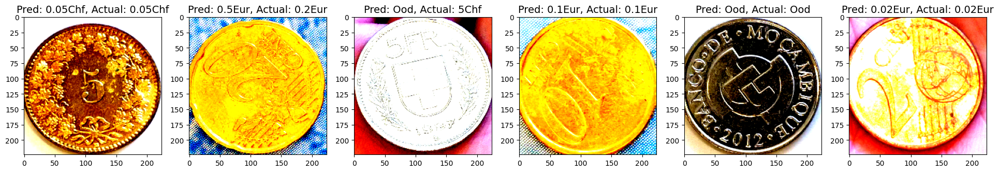

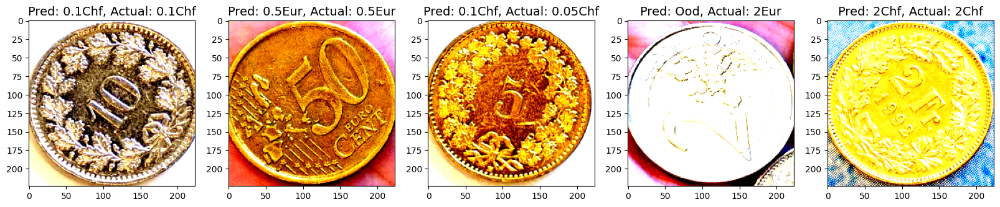

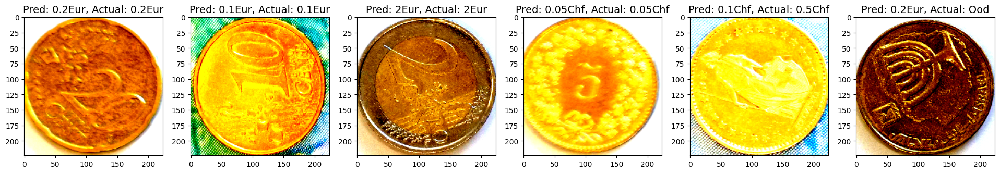

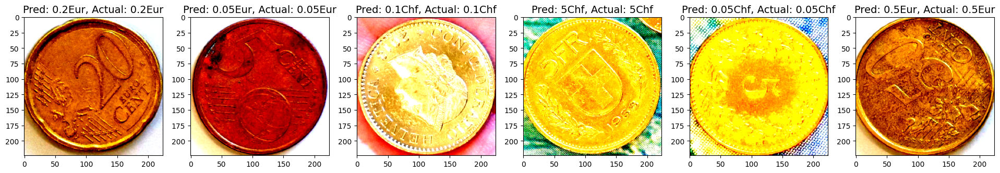

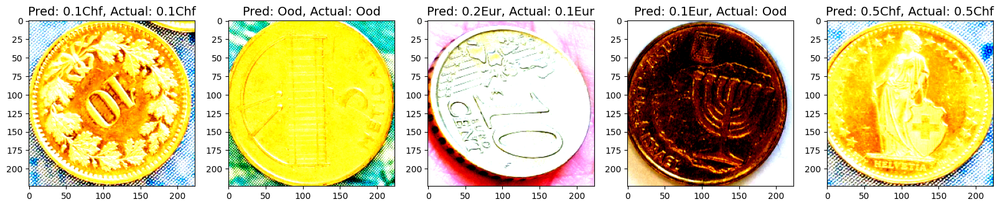

In [30]:
id_to_label = np.vectorize(lambda x: ID_TO_LABEL.get(x, "Unknown"))

for images, labels in eval_loader:
    
    images, labels = images.to(device), labels.to(device)
    
    logits = model(images)
    
    pred = id_to_label(logits.argmax(dim=-1).cpu().numpy())
    actual = id_to_label(labels.cpu().numpy())
    
    img_labels = [f"pred: {a1}, actual: {a2}" for a1, a2 in zip(pred, actual)]
    images = torch.clamp(images, 0, 1).cpu().numpy()
    
    images_dict = dict(zip(img_labels, images))

    plot_images(**images_dict)